# Scatter plot - dispersion

Content continous variables
- Individual scatter plot (compare 2 variables)
- features-target scatter plot (dispersion of all the features in a dataframe against a target)
- Individual feature x vs Individual feature y vs color target
- scatter between 2 variables with marginal distribution

Sources:
- https://plotly.com/python/line-and-scatter/

### 0. Package and load data
**Dataset: California Housing dataset**

**Features:**
* MedInc: median income in block group
* HouseAge: median house age in block group
* AveRooms: average number of rooms per household
* AveBedrms: average number of bedrooms per household
* Population: block group population
* AveOccup: average number of household members
* Latitude: block group latitude
* Longitude: block group longitude

In [1]:
from sklearn.datasets import fetch_california_housing
import numpy as np
import pandas as pd

# plotly
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

In [2]:
# load data
data_X, data_y = fetch_california_housing(return_X_y=True, as_frame=True)

# joinn and rename dataset
data = data_X.copy()
data['Price'] = data_y
data.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Price
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


### 1. Codes to plot

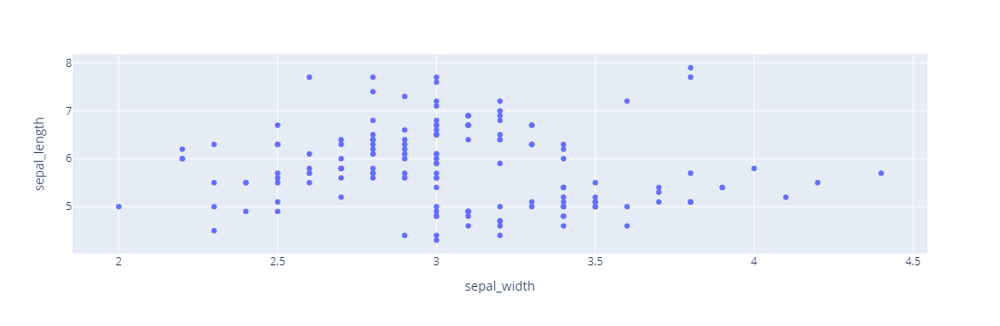

In [3]:
### Individual scatter plot (compare 2 variables)
df_example = px.data.iris()
fig = px.scatter(df_example, x="sepal_width", y="sepal_length")
fig.show()

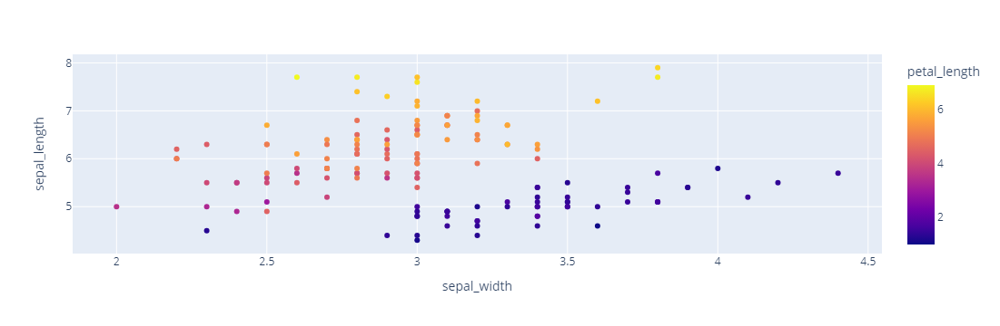

In [4]:
#### Individual feature x vs Individual feature y vs color target (continous variable)
df_example = px.data.iris()
fig = px.scatter(df_example, x="sepal_width", y="sepal_length", color='petal_length')
fig.show()

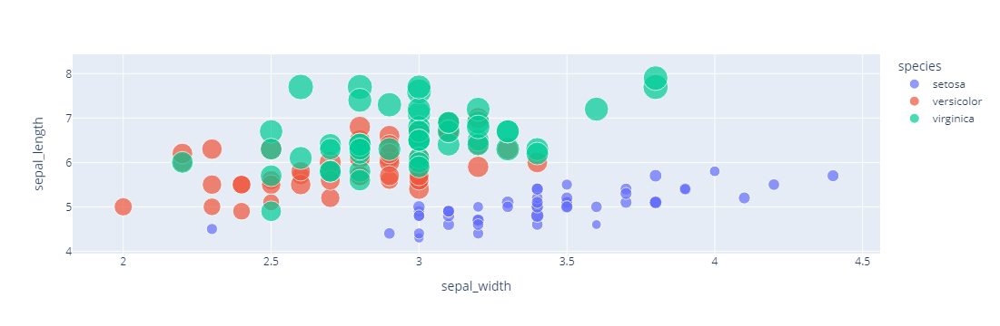

In [5]:
#### Individual feature x vs Individual feature y vs color target (discrete variable)
df_example = px.data.iris()
fig = px.scatter(df_example, x="sepal_width", y="sepal_length", color="species",
                 size='petal_length', hover_data=['petal_width'])
fig.show()

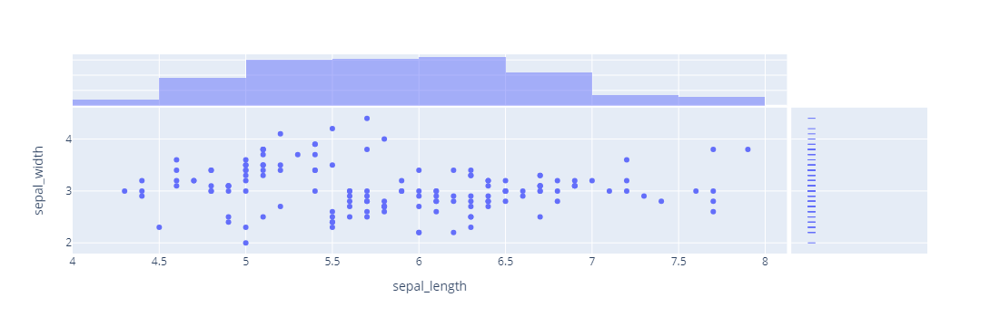

In [6]:
### scatter between 2 variables with marginal distribution
df_example = px.data.iris()
fig = px.scatter(df_example, x="sepal_length", y="sepal_width", marginal_x="histogram", marginal_y="rug")
fig.show()

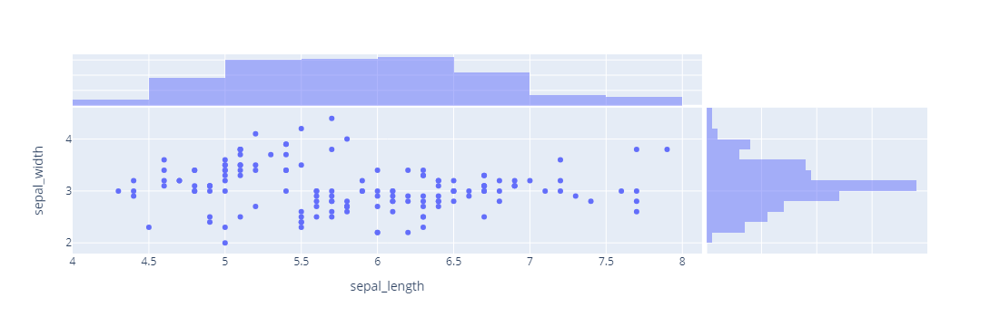

In [7]:
### scatter between 2 variables with marginal distribution
df_example = px.data.iris()
fig = px.scatter(df_example, x="sepal_length", y="sepal_width", marginal_x="histogram", marginal_y="histogram")
fig.show()

### 2. Codes to synthesize the analysis

In [8]:
def plot_individual_scatter_plot(df, feature_x, feature_y):
    """
    Create an individual scatter plot between two variables
    
    Args
        df (dataframe): input dataframe with the feature to plot in the scatter plot
        feature_x (string): name of the feature in x-axis
        feature_y (string): name of the feature in y-axis
    
    Return
        fig (figure plotly): fig of plotly with the plot generated
    """

    fig = px.scatter(df, x = feature_x, y = feature_y)

    return fig

In [9]:
def plot_features_to_target_scatter_plot(df, list_features, target, number_columns=2):
    """
    Create multiples plots (subplots) of the scatter plot between a list of features againts the target

    Args
        df (dataframe): input dataframe with features and target to plot in the scatter plot
        list_feautures (list): list of features to plot against the target
        target (string): target to be ploted in each graph
        number_columns (int): number of columns in the subplot. by default 2 columns

    Return
        fig (figure plotly): fig of plotly with the plot generated 
    """

    # calculate number of rows (considering the number of colums passed as args)
    if (len(list_features) % number_columns) != 0:
        number_rows = (len(list_features) // number_columns) + 1
    else:
        number_rows = (len(list_features) // number_columns)

    # create fig to plot
    fig = make_subplots(rows=number_rows, cols=number_columns, subplot_titles=tuple(list_features))

    ########## for each feature plot:
    for index_feature in range(len(list_features)):
        feature = list_features[index_feature]

        # get indexes in the subplot (in plotly the indexes starts in 1)
        row = (index_feature // number_columns) + 1
        column = (index_feature % number_columns) + 1


        # get fig individual
        fig_aux = plot_individual_scatter_plot(df = df, feature_x = feature, feature_y = target)
        
        
        # add to fig global
        fig.add_trace(fig_aux.data[0],
            row=row,
            col=column
        )

    # adjust the shape
    fig.update_layout(
        height = 350 * number_rows,  # largo
        width = 850 * number_columns,  # ancho
        title_text = "Compare scatters features againts a target",
        title_x=0.5
    )

    return fig

In [10]:
def plot_individual_scatter_plot_x_y_target(df, feature_x, feature_y, target):
    """
    Create an individual scatter plot between a feature_x , feauture_y and color the plot considering the target (continous variable)

    Args
        df (dataframe): input dataframe
        feature_x (string): name of the feature in x-axis
        feature_y (string): name of the feature in y-axis
        target (string): name of the target to color the scatter plot

    Return
        fig (figure plotly): fig of plotly with the plot generated 
    """

    fig = px.scatter(df, x= feature_x, y = feature_y, color = target)
    
    return fig

In [11]:
def plot_individual_scatter_with_marginal_hist(df, feature_x, feature_y):
    """
    Create an individual scatter plot between a feature_x and feature_y and plotting the histogram as marginal in the scatter plot
    
    Args
        df (dataframe): input dataframe
        feature_x (string): name of the feature in x-axis
        feature_y (string): name of the feature in y-axis
    
    Return
        fig (figure plotly): fig of plotly with the plot generated 
    """

    fig = px.scatter(df, x = feature_x, y = feature_y, marginal_x = "histogram", marginal_y="histogram")

    return fig

##### do plots

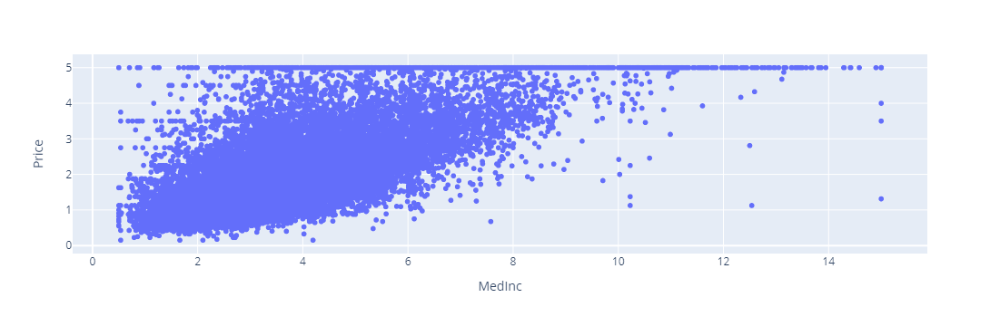

In [12]:
fig_1 = plot_individual_scatter_plot(df = data, 
                                     feature_x = data.columns.tolist()[0], 
                                     feature_y = data.columns.tolist()[-1])

fig_1.show()

# save
fig_1.write_html("output_eda/notebook6/plot_individual_scatter_plot.html")

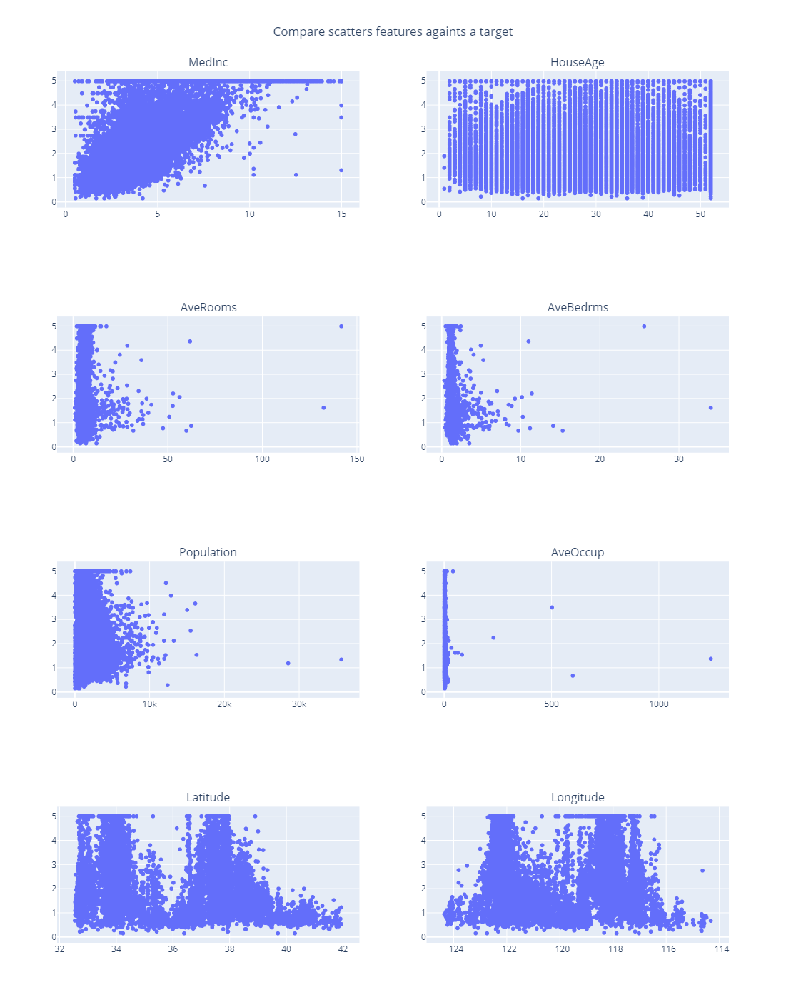

In [13]:
fig_2 = plot_features_to_target_scatter_plot(df = data, 
                                             list_features = data.columns.tolist()[:-1], 
                                             target = data.columns.tolist()[-1], 
                                             number_columns=2
                                            )

fig_2.show()

# save
fig_2.write_html("output_eda/notebook6/plot_features_to_target_scatter_plot.html")

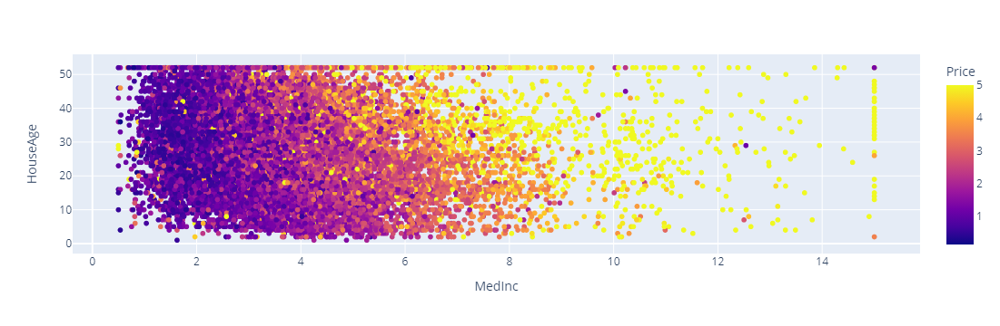

In [14]:
fig_3 = plot_individual_scatter_plot_x_y_target(df = data, 
                                                feature_x = data.columns.tolist()[0], 
                                                feature_y = data.columns.tolist()[1],
                                                target = data.columns.tolist()[-1]
                                               )
fig_3.show()


# save
fig_3.write_html("output_eda/notebook6/plot_individual_scatter_plot_x_y_target.html")

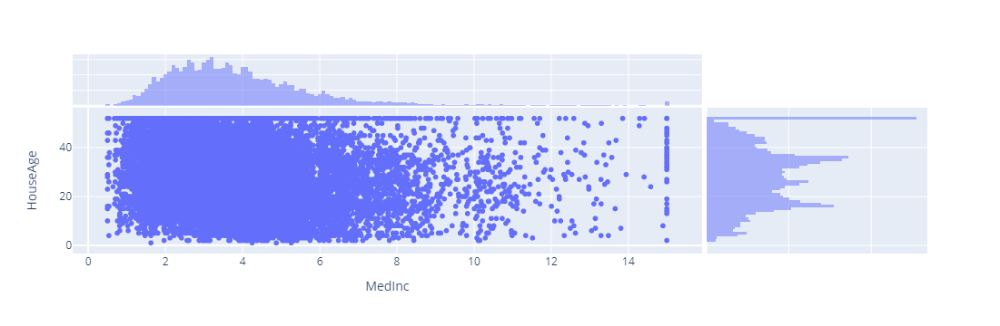

In [15]:
fig_4 = plot_individual_scatter_with_marginal_hist(df = data, 
                                                   feature_x = data.columns.tolist()[0],
                                                   feature_y = data.columns.tolist()[1],
                                                  )

fig_4.show()


# save
fig_4.write_html("output_eda/notebook6/plot_individual_scatter_with_marginal_hist.html")